In [ ]:
import pandas as pd
import pickle
from nltk.translate.bleu_score import corpus_bleu

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
filePath = r"/content/drive/MyDrive/Flickr8K/Flickr8k_text/Flickr8k.token.txt"
captions = pd.read_csv(filePath,sep="\t",header = None, names = ['Image','Caption'])


In [ ]:
captions.head()

,Image,Caption
0,1000268201_693b08cb0e.jpg#0,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg#1,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg#2,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg#3,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg#4,A little girl in a pink dress going into a woo...


In [ ]:
# Dictionary
Image_Description = {}

for index,row in captions.iterrows():
    image_name = row['Image'].split('.')[0]
    caption = row['Caption']
    if image_name not in Image_Description:
        Image_Description[image_name] = []
    Image_Description[image_name].append(caption)

In [ ]:
Image_Description['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

## Caption Cleaning

In [1]:
import re
def clean_caption(captions):
    # Lowercasing
     for i in range(len(captions)):
        caption = captions[i]
        caption = caption.lower()
        caption = re.sub("[^a-z]+"," ",caption)
        caption = caption.strip()
        captions[i] = caption

for image_name, caption in Image_Description.items():
    clean_caption(caption)
len(Image_Description)

NameError: name 'Image_Description' is not defined

# **Creating Vocabulary**

In [ ]:
#Total No. of words and frequency of each word
word_count = {}

for image_name, caption in Image_Description.items():
    for captions in caption:

        words=captions.split()

        for word in words:
            if word in word_count:
                word_count[word] += 1
            else:
                word_count[word] = 1

total_word_count = sum(word_count.values())
total_Words = len(word_count)

print("Total Word Count:", total_word_count)
print(total_Words)


Total Word Count: 437429
8441


In [ ]:
#Total No. of unique words
vocabulary = set()

for image_name,caption in Image_Description.items():
    for captions in caption:
        words = captions.split()
        vocabulary.update(words)


print("vocab size:",len(vocabulary))

vocab size: 8441


In [ ]:
#Remove words with less frequency
freq_threshold = 10
vocabulary = [word for word, frequency in word_count.items() if frequency >= freq_threshold]
print(freq_threshold)
print(len(vocabulary))

10
1961


# **Train-Test Split**

In [ ]:
import random

image_names = list(Image_Description.keys())

len(image_names)

8091

In [ ]:
from sklearn.model_selection import train_test_split
random.seed(42)

random.shuffle(image_names)

train_images, test_val_images = train_test_split(image_names, test_size=0.2, random_state=42)
val_images, test_images = train_test_split(test_val_images, test_size=0.5, random_state=42)

train_set = {image_name: Image_Description[image_name] for image_name in train_images}

print("Train Set:", len(train_set))
print("Validation Set:", len(val_images))
print("Test Set:", len(test_images))

for image_name, captions in train_set.items():
    train_set[image_name] = [f"startseq {caption} endseq" for caption in captions]

Train Set: 6472
Validation Set: 809
Test Set: 810


In [ ]:
print(train_images)

['3689355450_fd559b816d', '2726301121_95a2fbd22b', '397451339_76a84bd310', '3765374230_cb1bbee0cb', '2443512473_6f5a22eb42', '2707835735_6537b27e8f', '3277162496_dff7eeb59e', '2224995194_518859d97d', '2139519215_8ca16dd192', '3223302125_f8154417f4', '3009047603_28612247d2', '3450874870_c4dcf58fb3', '3396817186_b299ee0531', '3409326324_a704565e8f', '2752329719_868545b7d2', '241347611_cb265be138', '3365198533_539073002b', '3726120436_740bda8416', '2343879696_59a82f496f', '2971298546_dd595cf297', '493621130_152bdd4e91', '3547368652_0d85c665d3', '2390369143_6523253a73', '3627679667_0e3de9fc90', '3177298173_78cea31d64', '3621329299_6fb3f2935c', '2384550175_e421d3a871', '3280173193_98c2d6a223', '3210705660_2b14b7fb36', '2978024878_a45b282bf4', '3583704941_611353857e', '3386060324_b98fdfa449', '58357057_dea882479e', '2701895972_8605c4e038', '3195040792_a03954a19f', '482047956_9a29e9cee6', '2843695880_eeea6c67db', '2475162978_2c51048dca', '2409597310_958f5d8aff', '2065309381_705b774f51', '2204

In [ ]:
print(test_images)

['3325578605_afa7f662ec', '3282897060_8c584e2ce8', '3532194771_07faf20d76', '3405720825_b6991005eb', '2774430374_fee1d793e7', '367673290_f8799f3a85', '2319197581_94f807b204', '2339573065_91f1e3be60', '512101751_05a6d93e19', '2094810449_f8df9dcdf7', '152029243_b3582c36fa', '340667199_ecae5f6029', '464251704_b0f0c4c87a', '502783522_3656f27014', '3528902357_be2357a906', '3109780402_dbae082dc5', '3371887001_44ab0c2f17', '3432495898_a5859f06b6', '2385146732_d1c67c790e', '3304484212_b950233c30', '533602654_9edc74385d', '3566225740_375fc15dde', '2381613738_d8d2012e3c', '3686078365_9e655e238f', '3155987659_b9ea318dd3', '406901451_7eafd7568a', '2689001252_e0016c89f0', '2034553054_b00c166895', '3042484940_0975a5e486', '3648988742_888a16f600', '3257103624_e76f25ff9e', '2864634088_d087494dff', '2920969723_83918fe909', '2982881046_45765ced2c', '2718049631_e7aa74cb9b', '238512430_30dc12b683', '1332722096_1e3de8ae70', '537230454_1f09199476', '2918880895_e61f74f2f0', '2567812221_30fb64f5e9', '18085046

# **Image Preprocessing**

In [ ]:
!pip install keras

In [ ]:
!pip install tensorflow

In [ ]:
from keras.applications.resnet50 import ResNet50,preprocess_input as preprocess_input_resnet50
from keras.layers import Dense, GlobalAveragePooling2D,add,Input,Dropout,Embedding,LSTM
from keras.models import Model, load_model
from keras.optimizers import SGD
from keras.preprocessing import image
import numpy as np
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.applications import InceptionV3
from keras.applications.inception_v3 import preprocess_input as preprocess_input_inception, decode_predictions
from keras.applications import VGG16
from keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16, decode_predictions


**RESNET-50 MODEL**

In [ ]:
model_resnet = ResNet50(weights = "imagenet",input_shape=(224,224,3))
model_resnet.summary()

102967424/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                    

In [ ]:
model_new_resnet = Model(model_resnet.input,model_resnet.layers[-2].output)

In [ ]:
def preprocess_img_resnet(img):
    img = image.load_img(img,target_size=(224,224))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)

#     Normalisation
    img = preprocess_input_resnet50(img)
    return img

In [ ]:
IMG_PATH = "/content/drive/MyDrive/Flickr8K/Flicker8k_Images/"
import cv2
import matplotlib.pyplot as plt
img = preprocess_img_resnet(IMG_PATH+"1000268201_693b08cb0e.jpg")
plt.imshow(img[0])
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Flickr8K/Flicker8k_Images/1000268201_693b08cb0e.jpg'

# **Image Feature Extraction**

In [ ]:
def encode_image_resnet(img):
    img = preprocess_img_resnet(img)
    feature_vector = model_new_resnet.predict(img)
    feature_vector = feature_vector.reshape((-1,))
    return feature_vector

In [ ]:
img_path = IMG_PATH+img_id+"1000268201_693b08cb0e.jpg"
feature = encode_image_resnet(img_path)
print(feature.shape)

In [ ]:
encoding_train_resnet = {}

for ix,img_id in enumerate(train_set):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_train_resnet[img_id] = encode_image_resnet(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 1600
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 1700
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 1800
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 1900
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 2000
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 2100
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 2200
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 2300
1/1 [==============================] - 0s 39ms/step
Encoding in Progress Time Step 2400
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 2500
1/1 [==============================] - 0s 22ms/step
Encoding in Progr

In [ ]:
print(encoding_train_resnet)

{'3689355450_fd559b816d': array([0.22324125, 0.24537289, 0.01192314, ..., 0.20483018, 0.07847437,
       0.59414464], dtype=float32), '2726301121_95a2fbd22b': array([0.0755478 , 1.4480603 , 0.17224939, ..., 0.6841494 , 0.02349381,
       0.32252002], dtype=float32), '397451339_76a84bd310': array([0.1881056 , 0.31116024, 0.        , ..., 0.45101595, 0.9905227 ,
       0.10136313], dtype=float32), '3765374230_cb1bbee0cb': array([0.16550526, 0.7227542 , 0.32863975, ..., 0.08149702, 0.01920919,
       0.        ], dtype=float32), '2443512473_6f5a22eb42': array([1.2134598 , 0.00595224, 0.01534932, ..., 0.56739646, 0.02839765,
       0.15953526], dtype=float32), '2707835735_6537b27e8f': array([0.14384939, 0.5724096 , 0.01956771, ..., 2.4681654 , 0.15535076,
       0.46295017], dtype=float32), '3277162496_dff7eeb59e': array([0.29013637, 0.5429676 , 2.1434464 , ..., 0.22652213, 0.2927652 ,
       0.3135869 ], dtype=float32), '2224995194_518859d97d': array([0.6860492 , 1.3081094 , 0.22064932, .

In [ ]:
import pickle
with open("/content/drive/MyDrive/Flickr8K/encoding_train_resnet_features.pkl","wb") as f:
    pickle.dump(encoding_train_resnet,f)

In [ ]:

with open("/content/drive/MyDrive/Flickr8K/encoding_train_resnet_features.pkl", 'rb') as file:
    train_features_resnet = pickle.load(file)

In [ ]:
print(train_features_resnet['1000268201_693b08cb0e'].shape)

(2048,)


In [ ]:
encoding_test_resnet = {}

for ix,img_id in enumerate(test_images):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_test_resnet[img_id] = encode_image_resnet(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)

1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 0
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 100
1/1 [==============================] - 0s 24ms/step
Encoding in Progress Time Step 200
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 300
1/1 [==============================] - 0s 24ms/step
Encoding in Progress Time Step 400
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 500
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 600
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 700
1/1 [==============================] - 0s 39ms/step
Encoding in Progress Time Step 800
1/1 [==============================] - 0s 23ms/step


In [ ]:
import pickle
with open("/content/drive/MyDrive/Flickr8K/encoding_test_resnet_features.pkl","wb") as f:
    pickle.dump(encoding_test_resnet,f)

In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_test_resnet_features.pkl", 'rb') as file:
    test_features_resnet = pickle.load(file)

**INCEPTION V3 MODEL**

In [ ]:
model_inception = InceptionV3(weights='imagenet')
model_inception.summary()

96112376/96112376 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activatio

In [ ]:
model_new_inception = Model(model_inception.input, model_inception.layers[-2].output)

In [ ]:
def preprocess_img_inception(img):
    img = image.load_img(img,target_size=(299,299))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)

#     Normalisation
    img = preprocess_input_inception(img)
    return img

(299, 299, 3)


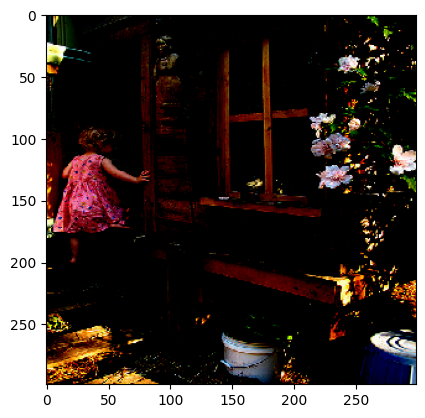

In [ ]:
IMG_PATH = "/content/drive/MyDrive/Flickr8K/Flicker8k_Images/"
import cv2
import matplotlib.pyplot as plt
img = preprocess_img_inception(IMG_PATH+"1000268201_693b08cb0e.jpg")
print(img[0].shape)
plt.imshow(img[0])
plt.show()

In [ ]:
def encode_image_inception(img):
    img = preprocess_img_inception(img)
    feature_vector = model_new_inception.predict(img)
    feature_vector = feature_vector.reshape((-1,))
    return feature_vector

In [ ]:
encoding_train_inception = {}

for ix,img_id in enumerate(train_set):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_train_inception[img_id] = encode_image_inception(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 1600
1/1 [==============================] - 0s 40ms/step
Encoding in Progress Time Step 1700
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 1800
1/1 [==============================] - 0s 24ms/step
Encoding in Progress Time Step 1900
1/1 [==============================] - 0s 24ms/step
Encoding in Progress Time Step 2000
1/1 [==============================] - 0s 24ms/step
Encoding in Progress Time Step 2100
1/1 [==============================] - 0s 36ms/step
Encoding in Progress Time Step 2200
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 2300
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 2400
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 2500
1/1 [==============================] - 0s 26ms/step
Encoding in Progr

In [ ]:
import pickle
with open("/content/drive/MyDrive/Flickr8K/encoding_train_inception_features.pkl","wb") as f:
    pickle.dump(encoding_train_inception,f)

In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_train_inception_features.pkl", 'rb') as file:
    train_features_inception = pickle.load(file)

In [ ]:
encoding_test_inception = {}

for ix,img_id in enumerate(test_images):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_test_inception[img_id] = encode_image_inception(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)

1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 0
1/1 [==============================] - 0s 54ms/step
Encoding in Progress Time Step 100
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 200
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 300
1/1 [==============================] - 0s 29ms/step
Encoding in Progress Time Step 400
1/1 [==============================] - 0s 40ms/step
Encoding in Progress Time Step 500
1/1 [==============================] - 0s 27ms/step
Encoding in Progress Time Step 600
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 700
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 800
1/1 [==============================] - 0s 38ms/step


In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_test_inception_features.pkl","wb") as f:
    pickle.dump(encoding_test_inception,f)

In [ ]:
import pickle
with open("/content/drive/MyDrive/Flickr8K/encoding_test_inception_features.pkl", 'rb') as file:
    test_features_inception = pickle.load(file)

**VGG 16 MODEL**

In [ ]:
model_vgg16 = VGG16(weights='imagenet')
model_vgg16.summary()

553467096/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
model_new_vgg16 = Model(model_vgg16.input, model_vgg16.layers[-2].output)

In [ ]:
def preprocess_img_vgg16(img):
    img = image.load_img(img,target_size=(224,224))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)

#     Normalisation
    img = preprocess_input_vgg16(img)
    return img

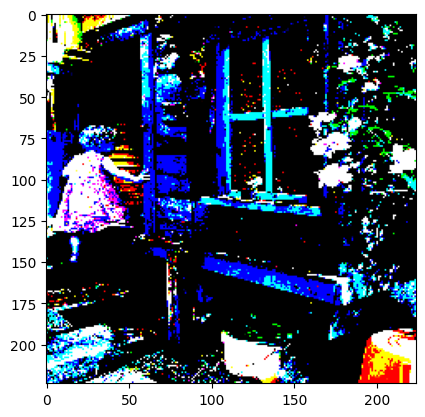

In [ ]:
IMG_PATH = "/content/drive/MyDrive/Flickr8K/Flicker8k_Images/"
import cv2
import matplotlib.pyplot as plt
img = preprocess_img_vgg16(IMG_PATH+"1000268201_693b08cb0e.jpg")
plt.imshow(img[0])
plt.show()

In [ ]:
def encode_image_vgg16(img):
    img = preprocess_img_vgg16(img)
    feature_vector = model_new_vgg16.predict(img)
    feature_vector = model_new_vgg16.predict(img)
    feature_vector = feature_vector.reshape((-1,))
    return feature_vector

In [ ]:
encoding_train_vgg16 = {}

for ix,img_id in enumerate(train_set):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_train_vgg16[img_id] = encode_image_vgg16(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 23ms/step
Encoding in Progress Time Step 4000
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 4100
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 4200
1/1 [==============================] - 0s 26ms/step
Encoding in Progress Time Step 4300
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 4400
1/1 [==============================] - 0s 25ms/step
Encoding in Progress Time Step 4500
1/1 [==============================] - 0s 63ms/step
Encoding in Progress Time Step 4600
1/1 [==============================] - 0s 19ms/step
Encoding in Progress Time Step 4700
1/1 [==============================] - 0s 22ms/step
Encoding in Progress Time Step 4800
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 4900
1/1 [==============================] - 0s 21ms/step
Encoding in Progr

In [ ]:
import pickle
with open("/content/drive/MyDrive/Flickr8K/encoding_train_vgg16_features.pkl","wb") as f:
    pickle.dump(encoding_train_vgg16,f)

In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_train_vgg16_features.pkl", 'rb') as file:
    train_features_vgg16 = pickle.load(file)

In [ ]:
encoding_test_vgg16 = {}

for ix,img_id in enumerate(test_images):
    img_path = IMG_PATH+img_id+".jpg"
    encoding_test_vgg16[img_id] = encode_image_vgg16(img_path)

    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)

1/1 [==============================] - 0s 19ms/step
Encoding in Progress Time Step 0
1/1 [==============================] - 0s 20ms/step
Encoding in Progress Time Step 100
1/1 [==============================] - 0s 29ms/step
Encoding in Progress Time Step 200
1/1 [==============================] - 0s 20ms/step
Encoding in Progress Time Step 300
1/1 [==============================] - 0s 19ms/step
Encoding in Progress Time Step 400
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 500
1/1 [==============================] - 0s 17ms/step
Encoding in Progress Time Step 600
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 700
1/1 [==============================] - 0s 21ms/step
Encoding in Progress Time Step 800
1/1 [==============================] - 0s 43ms/step


In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_test_vgg16_features.pkl","wb") as f:
    pickle.dump(encoding_test_vgg16,f)

In [ ]:
with open("/content/drive/MyDrive/Flickr8K/encoding_test_vgg16_features.pkl", 'rb') as file:
    test_features_vgg16 = pickle.load(file)

# **Data pre-processing for Captions**

In [ ]:
word_to_idx = {}
idx_to_word = {}

for i,word in enumerate(vocabulary):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [ ]:
print(len(idx_to_word))

1961


In [ ]:
idx_to_word[1962] = 'startseq'
word_to_idx['startseq'] = 1962

idx_to_word[1963] = 'endseq'
word_to_idx['endseq'] = 1963

vocab_size = len(word_to_idx) + 1
print("vocab size",vocab_size)

vocab size 1964


In [ ]:
with open("/content/drive/MyDrive/Flickr8K/Flickr8k_text/idx_to_word.pkl", "wb") as file:
    pickle.dump(idx_to_word, file, pickle.HIGHEST_PROTOCOL)
with open("/content/drive/MyDrive/Flickr8K/Flickr8k_text/word_to_idx.pkl", "wb") as file:
    pickle.dump(word_to_idx, file, pickle.HIGHEST_PROTOCOL)

In [ ]:
with open("/content/drive/MyDrive/Flickr8K/Flickr8k_text/word_to_idx.pkl", "rb") as file:
  word_to_idx = pickle.load(file)
with open("/content/drive/MyDrive/Flickr8K/Flickr8k_text/idx_to_word.pkl", "rb") as file:
  idx_to_word = pickle.load(file)

In [ ]:

# Find the maximum length of caption in training set
cap_len = []
for key in train_set.keys():
    for cap in train_set[key]:
        cap_len.append(len(cap.split()))
print(np.max(cap_len))
print(sum(cap_len) / len(cap_len))
print(np.median(cap_len))
print(np.min(cap_len))
max_len = 20

38
12.804851668726823
12.0
3


In [ ]:
##Data Loader(Generator)
def data_generator(train_set,features,word_to_idx,max_len,batch_size):
    x1,x2,y = [],[],[]

    n=0
    while True:
        for key,caption_list in train_set.items():
            n += 1

            photo = features[key]
            for caption in caption_list:
              # Converting each caption into a list of numbers
              seq = []
              for word in caption.split():
                if word in word_to_idx:
                  seq.append(word_to_idx[word])

                for i in range(1,len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]

                    #0 denote padding word
                    xi = pad_sequences([xi],maxlen = max_len,value=0,padding='post')[0]
                    yi = to_categorical([yi],num_classes=vocab_size)[0]

                    x1.append(photo)
                    x2.append(xi)
                    y.append(yi)

                if n == batch_size:
                    yield[[np.array(x1),np.array(x2)],np.array(y)]
                    x1,x2,y = [],[],[]
                    n = 0


In [ ]:
f = open(r"/content/drive/MyDrive/archive (1)/glove.6B.50d.txt", encoding = 'utf8')

In [ ]:
embedding_index = {}

for line in f:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:],dtype = 'float')
    embedding_index[word] = word_embedding

In [ ]:
f.close()
embedding_index['apple']

array([ 0.52042 , -0.8314  ,  0.49961 ,  1.2893  ,  0.1151  ,  0.057521,
       -1.3753  , -0.97313 ,  0.18346 ,  0.47672 , -0.15112 ,  0.35532 ,
        0.25912 , -0.77857 ,  0.52181 ,  0.47695 , -1.4251  ,  0.858   ,
        0.59821 , -1.0903  ,  0.33574 , -0.60891 ,  0.41742 ,  0.21569 ,
       -0.07417 , -0.5822  , -0.4502  ,  0.17253 ,  0.16448 , -0.38413 ,
        2.3283  , -0.66682 , -0.58181 ,  0.74389 ,  0.095015, -0.47865 ,
       -0.84591 ,  0.38704 ,  0.23693 , -1.5523  ,  0.64802 , -0.16521 ,
       -1.4719  , -0.16224 ,  0.79857 ,  0.97391 ,  0.40027 , -0.21912 ,
       -0.30938 ,  0.26581 ])

In [ ]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size,emb_dim))
    for word,idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)

        if embedding_vector is not None:
            matrix[idx] = embedding_vector
    return matrix

In [ ]:
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(1964, 50)

# **Model Architecture**

In [ ]:
input_img_features = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_features)
inp_img2 = Dense(256,activation='relu')(inp_img1)

#Caption as Input
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim = vocab_size, output_dim=50, mask_zero=True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

decoder1 = add([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size,activation='softmax')(decoder2)

# Combined model
model = Model(inputs=[input_img_features,input_captions],outputs=outputs)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 input_1 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 20, 50)               98200     ['input_2[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_1[0][0]']             
                                                                                              

In [ ]:
# Pre-initiate Embedding Layer
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer="adam")

# **Training of Model**

In [ ]:
epochs = 30
batch_size = 32
steps = len(train_set)//batch_size

In [ ]:
for i in range(epochs):
    generator = data_generator(train_set,train_features_resnet,word_to_idx,max_len,batch_size)
    model.fit(generator,epochs=1,steps_per_epoch = steps, verbose=1)
    model.save('/content/drive/MyDrive/Flickr8K/resnet_model_{}.h5'.format(i))

202/202 [==============================] - 161s 751ms/step - loss: 4.3524


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


202/202 [==============================] - 148s 732ms/step - loss: 2.0568


In [ ]:
def predict_caption(photo,model):
    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')

        ypred = model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text += (' ' + word)

        if word == 'endseq':
            break

    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)

    return final_caption

In [ ]:

all_img_names = list(test_features_resnet.keys())
import numpy as np
import matplotlib.pyplot as plt

# Check the length of your list of image names
num_images = len(test_features_resnet)

# Loop to display random images
for _ in range(15):
    # Generate a random index within the valid range
    idx = np.random.randint(0, num_images)

    # Retrieve the image name using the generated index
    img_name = all_img_names[idx]

    # Assuming the rest of your code remains the same
    photo_2048 = test_features_resnet[img_name].reshape((1, 2048))
    img_path = r"/content/drive/MyDrive/Flickr8K/Flicker8k_Images/" + img_name + ".jpg"
    i = plt.imread(img_path)
    model = load_model('/content/drive/MyDrive/Flickr8K/resnet_model_29.keras')

    caption = predict_caption(photo_2048,model)

    print(caption)

    plt.imshow(i)
    plt.axis("off")
    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Flickr8K/Flicker8k_Images/2801146217_03a0b59ccb.jpg'

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

test_features_resnet = {key: value.reshape(1,2048) for key, value in test_features_resnet.items()}
for key in test_images:
    # get actual caption
    captions = Image_Description[key]
    # predict the caption for image
    model = load_model('/content/drive/MyDrive/Flickr8K/resnet_model_29.keras')
    y_pred = predict_caption(test_features_resnet[key],model)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 27ms/step
BLEU-1: 0.561449
BLEU-2: 0.371495
BLEU-3: 0.241142
BLEU-4: 0.151472


In [ ]:
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_actual.pkl", 'rb') as file1:
    actual = pickle.load(file1)
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_predicted.pkl", 'rb') as file2:
    predicted = pickle.load(file2)
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

NameError: ignored

In [ ]:
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_actual.pkl","wb") as f:
    pickle.dump(actual,f)
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_predicted.pkl","wb") as f:
    pickle.dump(predicted,f)

**Model training using Inception**

In [ ]:
for i in range(epochs):
    generator = data_generator(train_set,train_features_inception,word_to_idx,max_len,batch_size)
    model.fit(generator,epochs=1,steps_per_epoch = steps, verbose=1)
    model.save('/content/drive/MyDrive/Flickr8K/inception_model_{}.h5'.format(i))

202/202 [==============================] - 154s 718ms/step - loss: 4.3715


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


202/202 [==============================] - 152s 755ms/step - loss: 2.1046


In [ ]:
# #pick some random images and see results
all_img_names = list(test_features_inception.keys())
import numpy as np
import matplotlib.pyplot as plt

# Check the length of your list of image names
num_images = len(test_features_inception)

# Loop to display random images
for _ in range(15):
    # Generate a random index within the valid range
    idx = np.random.randint(0, num_images)

    # Retrieve the image name using the generated index
    img_name = all_img_names[idx]

    # Assuming the rest of your code remains the same
    photo_2048 = test_features_inception[img_name].reshape((1, 2048))
    img_path = r"/content/drive/MyDrive/Flickr8K/Flicker8k_Images/" + img_name + ".jpg"
    i = plt.imread(img_path)
    model = load_model('/content/drive/MyDrive/Flickr8K/inception_model_29.keras')
    caption = predict_caption(photo_2048,model)

    print(caption)

    plt.imshow(i)
    plt.axis("off")
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Flickr8K/Flicker8k_Images/1389323170_d1c81d6b51.jpg'

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

test_features_inception = {key: value.reshape(1,2048) for key, value in test_features_inception.items()}
for key in test_images:
    # get actual caption
    captions = Image_Description[key]
    # predict the caption for image
    model = load_model('/content/drive/MyDrive/Flickr8K/inception_model_29.keras')
    y_pred = predict_caption(test_features_inception[key],model)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 24ms/step
BLEU-1: 0.558786
BLEU-2: 0.374694
BLEU-3: 0.246545
BLEU-4: 0.155791


In [ ]:
with open("/content/drive/MyDrive/archive/Flickr8K/inception_actual.pkl","wb") as f:
    pickle.dump(actual,f)
with open("/content/drive/MyDrive/archive/Flickr8K/inception_predicted.pkl","wb") as f:
    pickle.dump(predicted,f)

**Model Training using VGG16**

In [ ]:
input_img_features = Input(shape=(4096,))
inp_img1 = Dropout(0.3)(input_img_features)
inp_img2 = Dense(256,activation='relu')(inp_img1)

#Caption as Input
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim = vocab_size, output_dim=50, mask_zero=True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

decoder1 = add([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size,activation='softmax')(decoder2)

# Combined model
model = Model(inputs=[input_img_features,input_captions],outputs=outputs)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 input_1 (InputLayer)        [(None, 4096)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 20, 50)               98200     ['input_2[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 4096)                 0         ['input_1[0][0]']             
                                                                                              

In [ ]:
# Pre-initiate Embedding Layer
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False
model.compile(loss='categorical_crossentropy',optimizer="adam")

In [ ]:
for i in range(epochs):
    generator = data_generator(train_set,train_features_vgg16,word_to_idx,max_len,batch_size)
    model.fit(generator,epochs=1,steps_per_epoch = steps, verbose=1)
    model.save('/content/drive/MyDrive/Flickr8K/vgg16_model_{}.h5'.format(i))

202/202 [==============================] - 189s 895ms/step - loss: 4.3855


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


  2/202 [..............................] - ETA: 2:09 - loss: 2.0608

In [ ]:
def predict_caption_vgg16(photo,loaded_model):
    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')

        ypred = loaded_model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text += (' ' + word)

        if word == 'endseq':
            break

    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)

    return final_caption

1/1 [==============================] - 0s 22ms/step
a small brown and white dog is trying to jump onto a lot of stairs


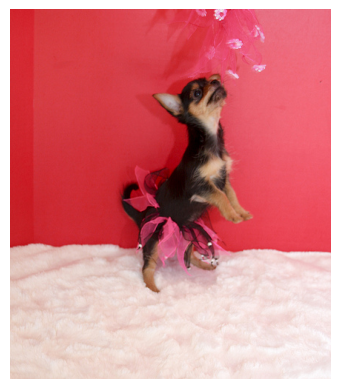

1/1 [==============================] - 0s 19ms/step
a man climbs a cliff


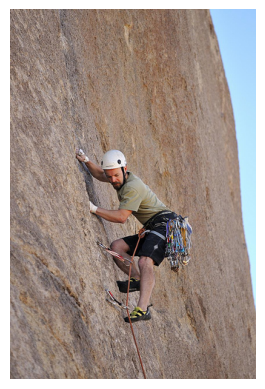

1/1 [==============================] - 0s 40ms/step
a man in a red shirt is rock climbing


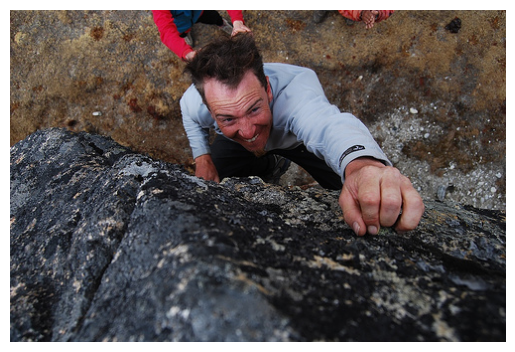

1/1 [==============================] - 0s 21ms/step
two dogs are running through grass


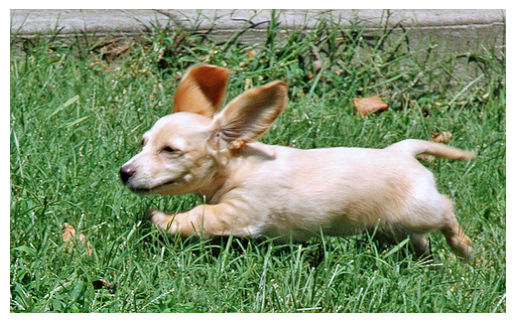

1/1 [==============================] - 0s 23ms/step
a boy in a black shirt is looking out of the water


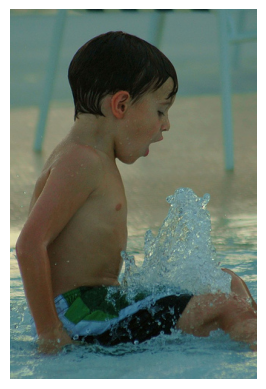

1/1 [==============================] - 0s 30ms/step
a man in a green shirt is sitting on a rock


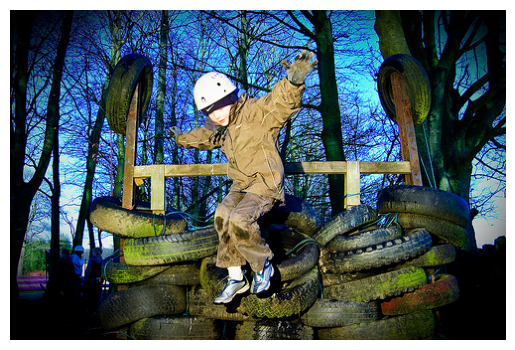

1/1 [==============================] - 0s 36ms/step
a girl in a red shirt is jumping into a park


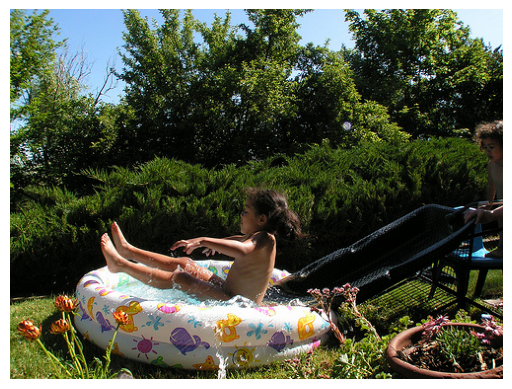

1/1 [==============================] - 0s 34ms/step
a dog swims through the water


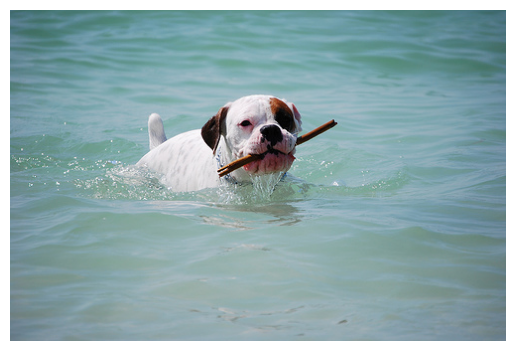

1/1 [==============================] - 0s 32ms/step
a man in a black shirt is jumping high in the air with a man in a black shirt


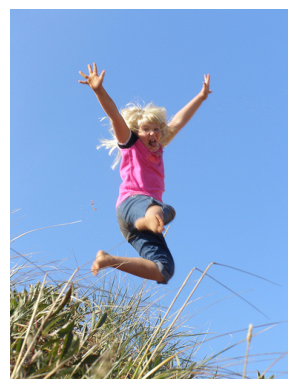

1/1 [==============================] - 0s 70ms/step
a crowd of people are performing a break on a narrow


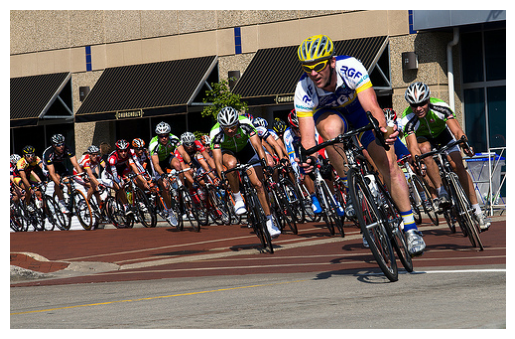

1/1 [==============================] - 0s 58ms/step
three boys are posing for a picture


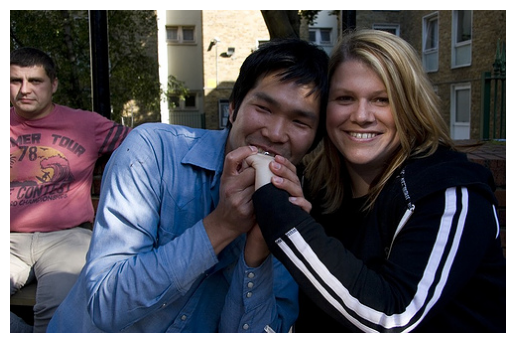

1/1 [==============================] - 0s 28ms/step
a person in a red jacket and helmet is skiing down a snowy hill


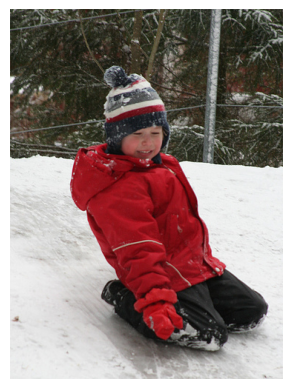

1/1 [==============================] - 0s 27ms/step
a man in a black coat is sitting next to a man in a brown shirt


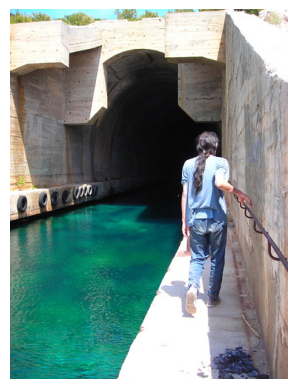

1/1 [==============================] - 0s 58ms/step
a dog leaps through the air to catch a frisbee


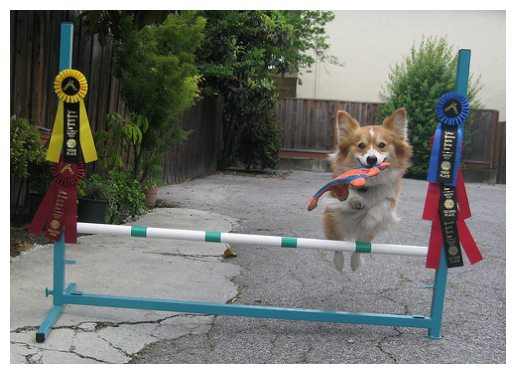

1/1 [==============================] - 0s 66ms/step
two dogs are playing tug of cloth


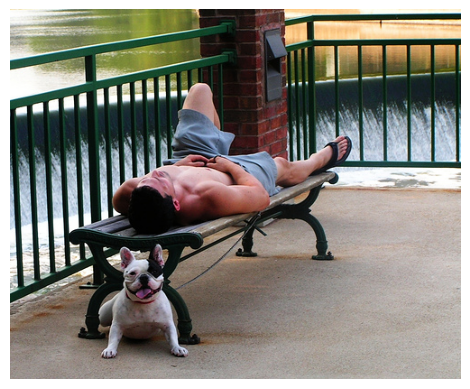

In [ ]:

all_img_names = list(test_features_vgg16.keys())

import numpy as np
import matplotlib.pyplot as plt

# Assuming encoding_test_resnet and predict_caption functions are defined

# Check the length of your list of image names
num_images = len(test_features_vgg16)

# Loop to display random images
for _ in range(15):
    # Generate a random index within the valid range
    idx = np.random.randint(0, num_images)

    # Retrieve the image name using the generated index
    img_name = all_img_names[idx]

    # Assuming the rest of your code remains the same
    photo_2048 = test_features_vgg16[img_name].reshape((1, 4096))
    img_path = r"/content/drive/MyDrive/Flickr8K/Flicker8k_Images/" + img_name + ".jpg"
    i = plt.imread(img_path)
    model = load_model('/content/drive/MyDrive/Flickr8K/vgg16_model_29.keras')
    caption = predict_caption_vgg16(photo_2048,model)

    print(caption)

    plt.imshow(i)
    plt.axis("off")
    plt.show()

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

test_features_vgg16 = {key: value.reshape(1,4096) for key, value in test_features_vgg16.items()}
for key in test_images:
    # get actual caption
    captions = Image_Description[key]
    # predict the caption for image
    loaded_model = load_model('/content/drive/MyDrive/Flickr8K/vgg16_model_29.keras')
    y_pred = predict_caption_vgg16(test_features_vgg16[key],loaded_model)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 42ms/step
BLEU-1: 0.528038
BLEU-2: 0.345001
BLEU-3: 0.217850
BLEU-4: 0.132301


In [ ]:
with open("/content/drive/MyDrive/archive/Flickr8K/vgg16_actual.pkl","wb") as f:
    pickle.dump(actual,f)
with open("/content/drive/MyDrive/archive/Flickr8K/vgg16_predicted.pkl","wb") as f:
    pickle.dump(predicted,f)

**Train model for 10 more epochs for each algo**

In [ ]:
load_resnet_model = load_model('/content/drive/MyDrive/archive/Flickr8K/model_29.keras')
add_epoch = 10
for i in range(epochs,add_epoch+epochs):
    generator = data_generator(train_set,train_features_resnet,word_to_idx,max_len,batch_size)
    load_resnet_model.fit(generator,epochs=1,steps_per_epoch = steps, verbose=1)
    load_resnet_model.save('/content/drive/MyDrive/archive/Flickr8K/model_{}.keras'.format(i))

202/202 [==============================] - 19s 92ms/step - loss: 2.0448


In [ ]:
def predict_caption(photo):
    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')

        ypred = load_resnet_model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text += (' ' + word)

        if word == 'endseq':
            break

    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)

    return final_caption

1/1 [==============================] - 0s 22ms/step
a small boy climbing a large wall


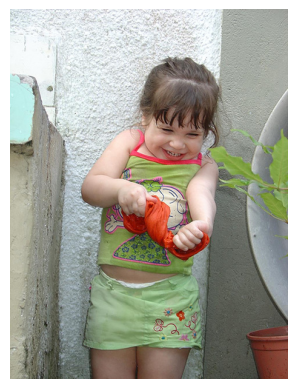

1/1 [==============================] - 0s 18ms/step
a man and a woman are sitting on a dock overlooking the ocean


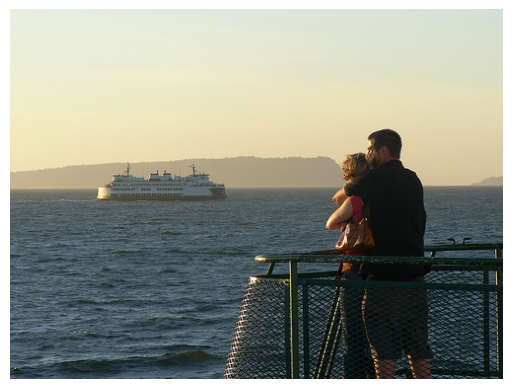

1/1 [==============================] - 0s 19ms/step
a beagle lays on the grass


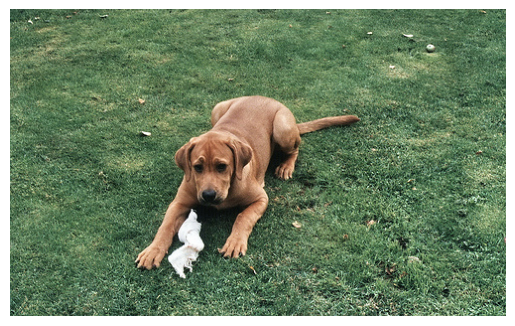

1/1 [==============================] - 0s 30ms/step
two girls are looking at the camera


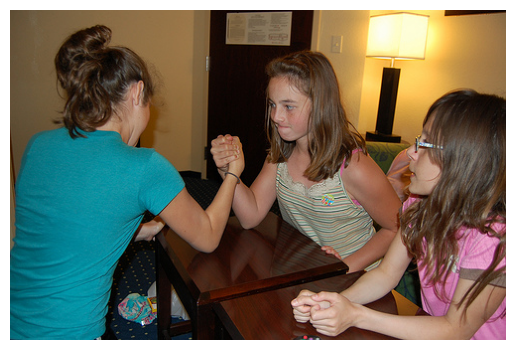

1/1 [==============================] - 0s 33ms/step
a person is hanging a large cliff


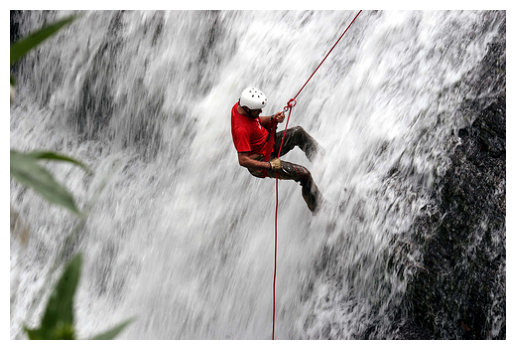

1/1 [==============================] - 0s 29ms/step
a baby in a red baby is sitting in a large baby


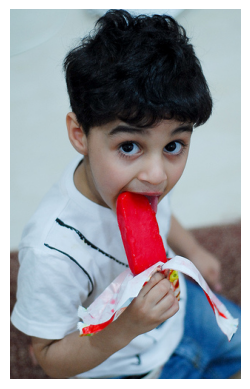

1/1 [==============================] - 0s 46ms/step
a boy in a green shirt is running in a field of yellow flowers


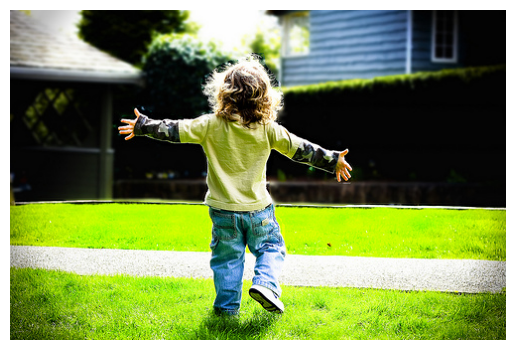

1/1 [==============================] - 0s 22ms/step
a man is standing on a wooden dock looking at the water


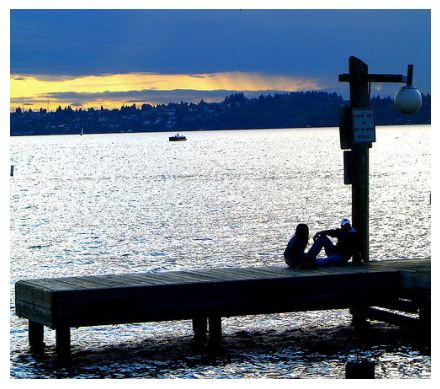

1/1 [==============================] - 0s 27ms/step
a man in a white shirt and white pants is playing students


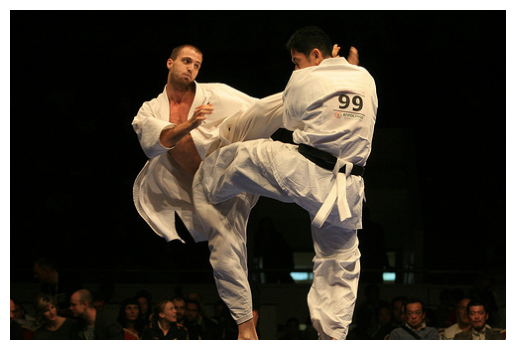

1/1 [==============================] - 0s 28ms/step
a white dog is running through the grass


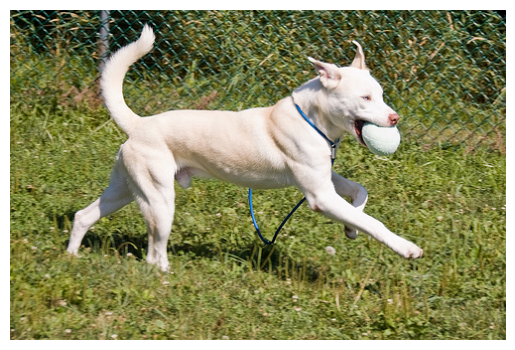

1/1 [==============================] - 0s 26ms/step
a man sits on a stage with a microphone


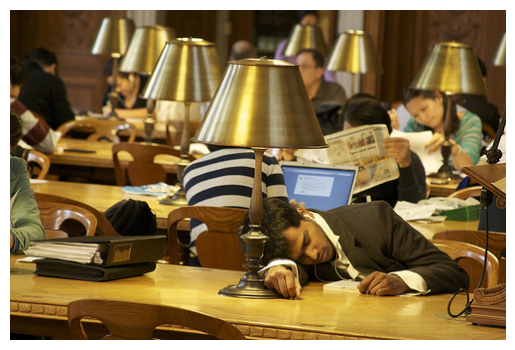

1/1 [==============================] - 0s 29ms/step
a woman in a blue sweater and blue sweater is sitting next to a blue door


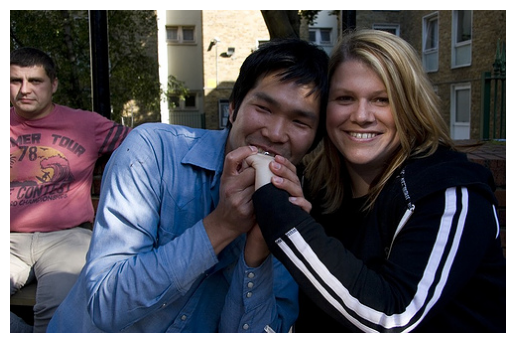

1/1 [==============================] - 0s 28ms/step
a brown dog is running through the snow


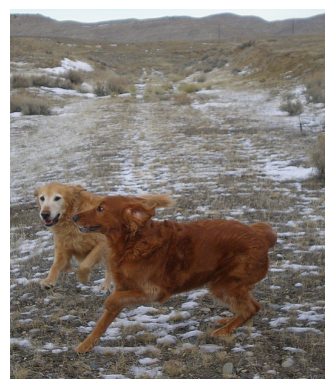

1/1 [==============================] - 0s 46ms/step
two boys are playing soccer in a park


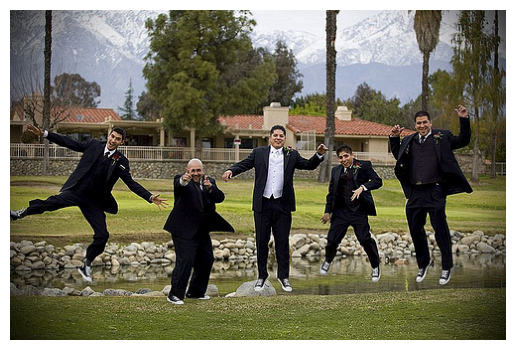

1/1 [==============================] - 0s 41ms/step
a baby is holding a baby that has been spread


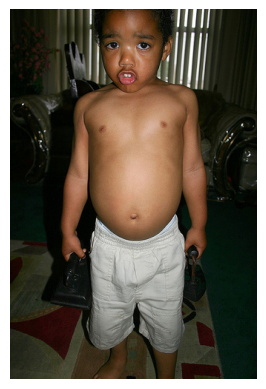

In [ ]:
# #pick some random images and see results
# for i in range(15):
#     idx = np.random.randint(0,1000)
all_img_names = list(test_features_resnet.keys())
#     img_name = all_img_names[idx]
#     photo_2048 = encoding_test_resnet[img_name].reshape((1,2048))
#     i = plt.imread(r"/content/drive/MyDrive/archive/Flickr8K/Flicker8k_Images/"+img_name+".jpg")
#     caption = predict_caption(photo_2048)
#     print(caption)
#     plt.imshow(i)
#     plt.axis("off")
#     plt.show()

import numpy as np
import matplotlib.pyplot as plt

# Assuming encoding_test_resnet and predict_caption functions are defined

# Check the length of your list of image names
num_images = len(test_features_resnet)

# Loop to display random images
for _ in range(15):
    # Generate a random index within the valid range
    idx = np.random.randint(0, num_images)

    # Retrieve the image name using the generated index
    img_name = all_img_names[idx]

    # Assuming the rest of your code remains the same
    photo_2048 = test_features_resnet[img_name].reshape((1, 2048))
    img_path = r"/content/drive/MyDrive/archive/Flickr8K/Flicker8k_Images/" + img_name + ".jpg"
    i = plt.imread(img_path)

    caption = predict_caption(photo_2048)

    print(caption)

    plt.imshow(i)
    plt.axis("off")
    plt.show()


In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

test_features_resnet = {key: value.reshape(1,2048) for key, value in test_features_resnet.items()}
for key in test_images:
    # get actual caption
    captions = Image_Description[key]
    # predict the caption for image
    y_pred = predict_caption(test_features_resnet[key])
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 62ms/step
BLEU-1: 0.553519
BLEU-2: 0.364297
BLEU-3: 0.234705
BLEU-4: 0.146122


**vgg 16 additional epochs**

In [ ]:
!pip install rouge-score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24933 sha256=0249077ae389b29270036f485bef3e96574e6d5734dfb64217811ce270b11378
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score


In [ ]:
from nltk.translate.bleu_score import corpus_bleu
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_actual.pkl", 'rb') as file1:
    actual = pickle.load(file1)
with open("/content/drive/MyDrive/archive/Flickr8K/resnet_predicted.pkl", 'rb') as file2:
    predicted = pickle.load(file2)
print("RESNET-50")
BLEU1 = corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))
BLEU2 = corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0))
BLEU3 = corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0))
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))


with open("/content/drive/MyDrive/archive/Flickr8K/inception_actual.pkl", 'rb') as file1:
    actual = pickle.load(file1)
with open("/content/drive/MyDrive/archive/Flickr8K/inception_predicted.pkl", 'rb') as file2:
    predicted = pickle.load(file2)
print("INCEPTION V3")
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

with open("/content/drive/MyDrive/archive/Flickr8K/vgg16_actual.pkl", 'rb') as file1:
    actual = pickle.load(file1)
with open("/content/drive/MyDrive/archive/Flickr8K/vgg16_predicted.pkl", 'rb') as file2:
    predicted = pickle.load(file2)
print("VGG16")
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

RESNET-50
BLEU-1: 0.561449
BLEU-2: 0.371495
BLEU-3: 0.241142
BLEU-4: 0.151472
INCEPTION V3
BLEU-1: 0.558786
BLEU-2: 0.374694
BLEU-3: 0.246545
BLEU-4: 0.155791
VGG16
BLEU-1: 0.528038
BLEU-2: 0.345001
BLEU-3: 0.217850
BLEU-4: 0.132301


In [ ]:
load_resnet_model = load_model('/content/drive/MyDrive/Flickr8K/resnet_model_29.h5')
add_epoch = 10

for i in range(epochs,add_epoch+epochs):
    generator = data_generator(train_set,train_features_resnet,word_to_idx,max_len,batch_size)
    load_resnet_model.fit(generator,epochs=1,steps_per_epoch = steps, verbose=1)
    load_resnet_model.save('/content/drive/MyDrive/archive/Flickr8K/resnet_model_{}.h5'.format(i))

202/202 [==============================] - 164s 773ms/step - loss: 2.0467


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


202/202 [==============================] - 153s 757ms/step - loss: 1.9637


In [ ]:
load_inception_model = load_model('/content/drive/MyDrive/Flickr8K/inception_model_29.h5')
add_epoch = 10
for i in range(epochs,add_epoch+epochs):
  generator = data_generator(train_set,train_features_inception,word_to_idx,max_len,batch_size)
  load_inception_model.fit(generator,epochs=1,steps_per_epoch = steps,verbose=1)
  load_inception_model.save('/content/drive/MyDrive/archive/Flickr8K/inception_model_{}.h5'.format(i))

202/202 [==============================] - 156s 747ms/step - loss: 2.0892


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


202/202 [==============================] - 156s 773ms/step - loss: 1.9973
